# Trend VAE
This notebook demonstrates the training of a Linear Variational Autoencoder (VAE) to learn transformations from input climate data to corresponding forced responses, with BCE loss for reconstruction.

In [2]:
# Import necessary libraries
import pandas as pd
import pickle as pkl
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os, sys
import random
import warnings


from torch.utils.data import DataLoader

# Add utility paths
sys.path.append(os.path.join(os.getcwd(), 'utils'))

# Import utility functions
from utils.data_loading import *
from utils.data_processing import *
from utils.trend_vae import *
from utils.animation import *
from utils.metrics import *
from utils.pipeline import *

# Enable autoreload
%reload_ext autoreload
%autoreload 2

# Suppress warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Define data path
current_dir = os.getcwd()
data_path = os.path.join(current_dir, 'data')
print(f"Data path: {data_path}")

Data path: /Users/lharriso/Documents/GitHub/gm4cs-l/data


In [3]:
# Use MPS / Cuda or CPU if none of the options are available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
random.seed(42)

Using device: mps


In [4]:
# Load the data
filename = os.path.join(data_path, 'ssp585_time_series.pkl')
data, nan_mask = preprocess_data(data_path, filename)

Loading data from /Users/lharriso/Documents/GitHub/gm4cs-l/data/ssp585_time_series.pkl
Data loaded successfully.
Filtering data...


100%|██████████| 72/72 [00:00<00:00, 32010.80it/s]

Data filtered. Kept 34 models
Creating NaN mask...



100%|██████████| 34/34 [00:02<00:00, 14.47it/s]

NaN mask created.
Masking out NaN values...



100%|██████████| 34/34 [00:01<00:00, 27.19it/s]

NaN values masked out.
Reshaping data...



100%|██████████| 34/34 [00:04<00:00,  8.02it/s]

Data reshaped.
Adding the forced response to the data...



100%|██████████| 34/34 [00:05<00:00,  5.95it/s]

Forced response added.
Removing NaN values from the grid...



100%|██████████| 34/34 [00:02<00:00, 14.18it/s]

NaN values removed.


In [5]:
# Randomly select and keep the data corresponding to n models
n = 5
model_keys = random.sample(data.keys(), n)
data = {key: value for key,value in data.items() if key in model_keys}

/var/folders/9v/q6t68ds12f9c4dgn9gnwzrmr0000gn/T/ipykernel_33275/3740862327.py:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  model_keys = random.sample(data.keys(), n)


In [6]:
# Select one of the models randomly for testing and the rest for training according to the leave-one-out strategy
test_model = random.choice(list(data.keys()))
train_models = [model for model in data.keys() if model != test_model]

# Create the training and testing datasets
train_data = {model: data[model] for model in train_models}
test_data = {test_model: data[test_model]}

print(f"Training models: {train_models}")
print(f"Testing model: {test_model}")

Training models: ['EC-Earth3', 'E3SM-2-0', 'GISS-E2-1-G', 'ACCESS-ESM1-5']
Testing model: GISS-E2-2-G


In [7]:
center = True
normalized_train_data, normalized_test_data, _, _ = normalize_data(train_data, test_data, center=center)


Normalizing data...


  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 20.74it/s]

Data normalization completed.


In [8]:
# Print the distribution of the data
# Flatten the data for analysis
# flattened_data = np.concatenate([np.ravel(array) for model in normalized_train_data.values() for array in model.values()])
# print("Flattened the data")
# # Plot the distribution of the data
# plt.figure(figsize=(10, 6))
# sns.histplot(flattened_data, bins=50, kde=False)
# plt.title('Distribution of Flattened Data')
# plt.xlabel('Value')
# plt.ylabel('Frequency')
# plt.show()

In [9]:
# # Flatten the normalized_test_data for analysis
# flattened_test_data = np.concatenate([np.ravel(array) for model in normalized_test_data.values() for array in model.values()])

# # Plot the distribution of the flattened normalized_test_data
# plt.figure(figsize=(10, 6))
# sns.histplot(flattened_test_data, bins=50, kde=False)
# plt.title('Distribution of Normalized Test Data')
# plt.xlabel('Value')
# plt.ylabel('Frequency')
# plt.show()

In [10]:
# Create dataset for the linear VAE
train_dataset = ClimateDataset(normalized_train_data)
test_dataset = ClimateDataset(normalized_test_data)

# Create dataloaders
batch_size = 16  # Higher batch size for linear VAE
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Print dataset sizes
print(f'Training dataset size: {len(train_dataset)}')
print(f'Testing dataset size: {len(test_dataset)}')

# Check the shape of the data
sample = next(iter(train_loader))
print(f"Input shape: {sample['input'].shape}")
print(f"Output shape: {sample['output'].shape}")

Creating datasets...


Processing models: 100%|██████████| 4/4 [00:00<00:00, 73908.44it/s]
/Users/lharriso/Documents/GitHub/gm4cs-l/utils/trend_vae.py:107: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:257.)
  self.inputs = torch.tensor(self.inputs, dtype=torch.float32)


Creating datasets...


Processing models: 100%|██████████| 1/1 [00:00<00:00, 25115.59it/s]


Training dataset size: 124
Testing dataset size: 11
Input shape: torch.Size([16, 165, 6523])
Output shape: torch.Size([16, 165, 6523])


In [11]:
# Initialize the Linear VAE model
# Calculate input dimension from flattened sample
sample = next(iter(train_loader))

# Set VAE parameters
hidden_dim = 128  # Increased for better representation
feat_dim = 6523
latent_dim = 64   # Intermediate layer size
z_dim = 5       # Actual latent space dimension
trend_poly = 2
seq_len, _ = sample['input'].shape[1:]
print(f"The sequence length is {seq_len}")
# beta = 0.001      # Weight for KL divergence term -- not used in this version

# Create the model
vae_model = Trend_Vae(
    seq_len=seq_len,
    feat_dim=feat_dim,
    hidden_dim=hidden_dim,
    latent_dim=latent_dim,
    z_dim=z_dim,
    trend_poly=trend_poly,
    device=device,
).to(device)

# Print model summary
print("\nTrend VAE Model Architecture:")
print(vae_model)
print(f"\nTotal parameters: {sum(p.numel() for p in vae_model.parameters() if p.requires_grad):,}")

The sequence length is 165

Trend VAE Model Architecture:
Trend_Vae(
  (encoder): Sequential(
    (0): Linear(in_features=1076295, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
  )
  (mean_layer): Linear(in_features=64, out_features=5, bias=True)
  (var_layer): Linear(in_features=64, out_features=5, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=5, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=64, out_features=128, bias=True)
    (4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negat

In [12]:
# Train the VAE
epochs = 50
losses = []

optimizer = torch.optim.Adam(vae_model.parameters(), lr=3e-4) # Weight decay is not used in this version (was weight_decay=1e-5)


losses = train_vae(vae_model, train_loader, optimizer, epochs=epochs, device=device)

Epoch 1/50: 100%|██████████| 8/8 [00:03<00:00,  2.43it/s]


Epoch 1, Loss: 325216.4395


Epoch 2/50: 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]


Epoch 2, Loss: 256380.7621


Epoch 3/50: 100%|██████████| 8/8 [00:01<00:00,  4.44it/s]


Epoch 3, Loss: 183598.1593


Epoch 4/50: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]


Epoch 4, Loss: 153124.5111


Epoch 5/50: 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]


Epoch 5, Loss: 117109.1502


Epoch 6/50: 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]


Epoch 6, Loss: 89441.4975


Epoch 7/50: 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]


Epoch 7, Loss: 74564.2006


Epoch 8/50: 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]


Epoch 8, Loss: 64408.6507


Epoch 9/50: 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]


Epoch 9, Loss: 55732.5091


Epoch 10/50: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]


Epoch 10, Loss: 48295.3758


Epoch 11/50: 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]


Epoch 11, Loss: 43884.5459


Epoch 12/50: 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]


Epoch 12, Loss: 37662.7089


Epoch 13/50: 100%|██████████| 8/8 [00:01<00:00,  4.05it/s]


Epoch 13, Loss: 35179.1734


Epoch 14/50: 100%|██████████| 8/8 [00:01<00:00,  4.25it/s]


Epoch 14, Loss: 30233.5935


Epoch 15/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 15, Loss: 26660.3672


Epoch 16/50: 100%|██████████| 8/8 [00:02<00:00,  3.63it/s]


Epoch 16, Loss: 30379.0202


Epoch 17/50: 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]


Epoch 17, Loss: 26031.4680


Epoch 18/50: 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]


Epoch 18, Loss: 22414.9690


Epoch 19/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 19, Loss: 22695.4589


Epoch 20/50: 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]


Epoch 20, Loss: 20167.5063


Epoch 21/50: 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]


Epoch 21, Loss: 19630.2145


Epoch 22/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 22, Loss: 17996.5785


Epoch 23/50: 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]


Epoch 23, Loss: 15760.1106


Epoch 24/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 24, Loss: 15737.9007


Epoch 25/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 25, Loss: 15914.9859


Epoch 26/50: 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]


Epoch 26, Loss: 14325.6159


Epoch 27/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 27, Loss: 13149.4446


Epoch 28/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 28, Loss: 14304.3809


Epoch 29/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 29, Loss: 12593.3308


Epoch 30/50: 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]


Epoch 30, Loss: 12079.0694


Epoch 31/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 31, Loss: 11936.6333


Epoch 32/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 32, Loss: 11021.4616


Epoch 33/50: 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]


Epoch 33, Loss: 10516.6691


Epoch 34/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 34, Loss: 8842.6336


Epoch 35/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 35, Loss: 8575.0890


Epoch 36/50: 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]


Epoch 36, Loss: 8211.8303


Epoch 37/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 37, Loss: 7018.5200


Epoch 38/50: 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]


Epoch 38, Loss: 8586.3312


Epoch 39/50: 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]


Epoch 39, Loss: 6755.2617


Epoch 40/50: 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]


Epoch 40, Loss: 7333.2525


Epoch 41/50: 100%|██████████| 8/8 [00:01<00:00,  4.36it/s]


Epoch 41, Loss: 7842.0849


Epoch 42/50: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]


Epoch 42, Loss: 8291.8228


Epoch 43/50: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]


Epoch 43, Loss: 8445.1325


Epoch 44/50: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]


Epoch 44, Loss: 8327.1707


Epoch 45/50: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]


Epoch 45, Loss: 5187.6959


Epoch 46/50: 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]


Epoch 46, Loss: 5027.4794


Epoch 47/50: 100%|██████████| 8/8 [00:01<00:00,  4.70it/s]


Epoch 47, Loss: 5260.4822


Epoch 48/50: 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]


Epoch 48, Loss: 6824.3238


Epoch 49/50: 100%|██████████| 8/8 [00:01<00:00,  4.24it/s]


Epoch 49, Loss: 5151.0686


Epoch 50/50: 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]

Epoch 50, Loss: 5384.9938


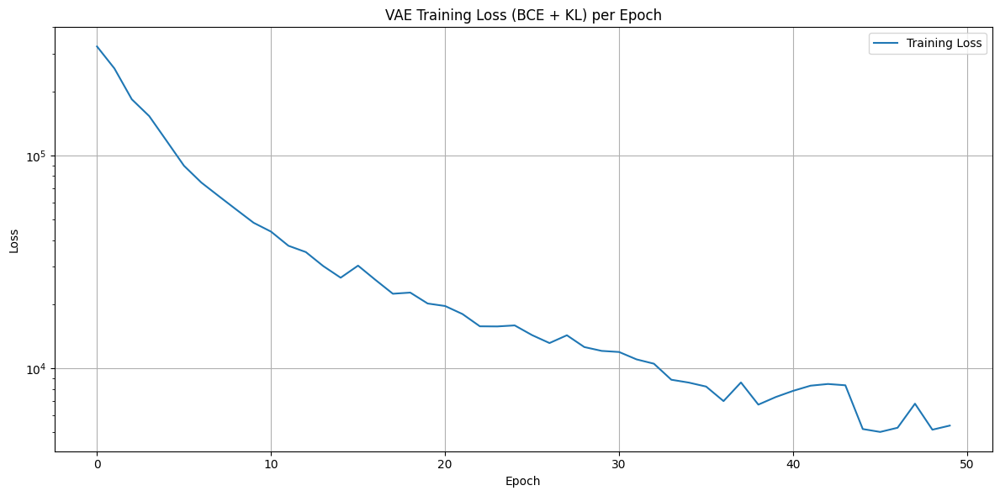

Final loss value: 5384.993763


In [13]:
# Plot the training loss
plt.figure(figsize=(12, 6))
plt.plot(losses, label='Training Loss')
plt.legend()
plt.title('VAE Training Loss (BCE + KL) per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.yscale('log')  # Using log scale to better visualize the decreasing loss
plt.tight_layout()
plt.show()

# Print the final loss value
print(f"Final loss value: {losses[-1]:.6f}")

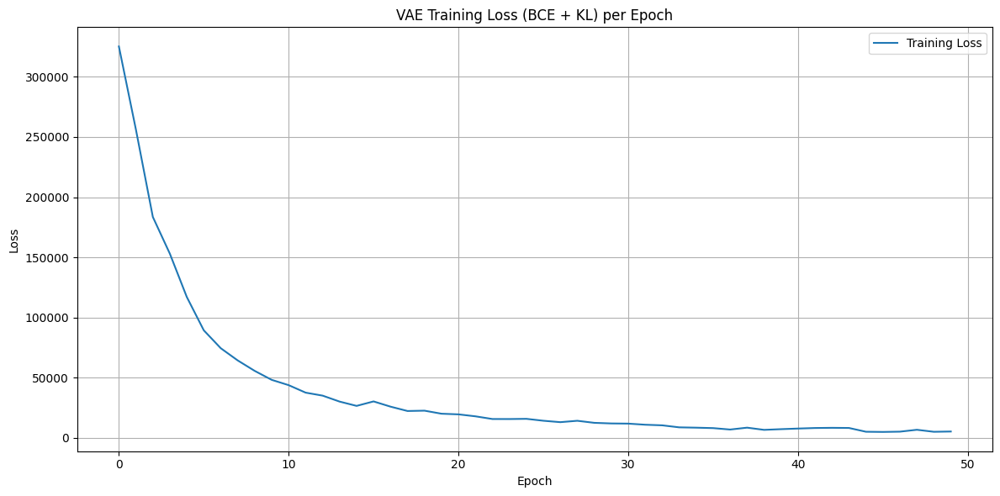

Final loss value: 5384.993763


In [14]:
# Plot the training loss
plt.figure(figsize=(12, 6))
plt.plot(losses, label='Training Loss')
plt.legend()
plt.title('VAE Training Loss (BCE + KL) per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
# plt.yscale('log')  # Using log scale to better visualize the decreasing loss
plt.tight_layout()
plt.show()

# Print the final loss value
print(f"Final loss value: {losses[-1]:.6f}")

# Random Run Selection and Inference
Now we'll select some random runs from the test model and use our trained VAE model to make predictions.

In [15]:
# Set the number of random runs to select
num_runs = 5

# Get the available runs for the test model (excluding forced_response)
test_runs = [run for run in normalized_test_data[test_model].keys() if run != 'forced_response']
print(f"Available runs for {test_model}: {test_runs}")

# Randomly select runs
if len(test_runs) > num_runs:
    selected_runs = random.sample(test_runs, num_runs)
else:
    selected_runs = test_runs
    
print(f"Selected runs for visualization: {selected_runs}")

Available runs for GISS-E2-2-G: ['r1i1p1f1', 'r1i1p3f1', 'r2i1p1f1', 'r2i1p3f1', 'r3i1p1f1', 'r3i1p3f1', 'r4i1p1f1', 'r4i1p3f1', 'r5i1p1f1', 'r5i1p3f1', 'r6i1p1f1']
Selected runs for visualization: ['r1i1p3f1', 'r5i1p1f1', 'r6i1p1f1', 'r4i1p1f1', 'r1i1p1f1']


In [16]:
# Set VAE to evaluation mode
vae_model.eval()

# Create a directory for saving animations if it doesn't exist
animation_dir = os.path.join('outputs_vae_test', 'animations', 'vae')
os.makedirs(animation_dir, exist_ok=True)
print(f"Animations will be saved to: {animation_dir}")

# Get ground truth for the test model
ground_truth = normalized_test_data[test_model]['forced_response']

# Store predictions for visualization
predictions = {}
mse_values = {}

# Generate predictions for each selected run
for run in selected_runs:
    # Get the run data
    run_data = normalized_test_data[test_model][run] # Shape 165 x 6523
    
    # Convert to torch tensor
    input_tensor = torch.tensor(run_data, dtype=torch.float32).unsqueeze(0).contiguous().view(1,-1).to(device) # Shape 1076295 = input_dim
    print(input_tensor.shape)
    
    # Make prediction with the VAE
    with torch.no_grad():
        # Forward pass through the VAE
        reconstructed, mu, log_var = vae_model(input_tensor)
        prediction = reconstructed.reshape(165, 6523).cpu().numpy()
    
    # Store prediction
    predictions[run] = prediction  # Reshape to original dimensions
    
    # Calculate MSE
    mse = np.mean((prediction - ground_truth) ** 2)
    mse_values[run] = mse
    print(f"MSE for {test_model} - {run}: {mse:.4f}")

print(f"\nAverage MSE across all selected runs: {np.mean(list(mse_values.values())):.4f}")

Animations will be saved to: outputs_vae_test/animations/vae
torch.Size([1, 1076295])
MSE for GISS-E2-2-G - r1i1p3f1: 0.2162
torch.Size([1, 1076295])
MSE for GISS-E2-2-G - r5i1p1f1: 0.2265
torch.Size([1, 1076295])
MSE for GISS-E2-2-G - r6i1p1f1: 0.2276
torch.Size([1, 1076295])
MSE for GISS-E2-2-G - r4i1p1f1: 0.2112
torch.Size([1, 1076295])
MSE for GISS-E2-2-G - r1i1p1f1: 0.2100

Average MSE across all selected runs: 0.2183


In [17]:
# Find the color limits for consistent visualization
all_data = []

# Add ground truth data
ground_truth_with_nans = readd_nans_to_grid(ground_truth, nan_mask, predictions=True)
all_data.append(ground_truth_with_nans)

# Add input data and predictions
for run in selected_runs:
    # Input data
    input_data = readd_nans_to_grid(normalized_test_data[test_model][run], nan_mask, predictions=True)
    all_data.append(input_data)
    
    # Prediction
    prediction_with_nans = readd_nans_to_grid(predictions[run], nan_mask, predictions=True)
    all_data.append(prediction_with_nans)

# Find the minimum and maximum values across all data
all_data_concatenated = np.concatenate([data.flatten() for data in all_data])
all_data_concatenated = all_data_concatenated[~np.isnan(all_data_concatenated)]
vmin, vmax = np.nanpercentile(all_data_concatenated, [2, 98])

print(f"Color limits for visualization: [{vmin:.2f}, {vmax:.2f}]")

Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Color limits for visualization: [-4.43, 0.94]


In [ ]:
# Generate animations
for run in selected_runs:
    print(f"\nGenerating animations for {test_model} - {run}...")
    
    # Reshape data for animation
    input_data = readd_nans_to_grid(normalized_test_data[test_model][run], nan_mask, predictions=True)
    input_data = input_data.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    prediction_data = readd_nans_to_grid(predictions[run], nan_mask, predictions=True)
    prediction_data = prediction_data.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    ground_truth_data = readd_nans_to_grid(ground_truth, nan_mask, predictions=True)
    ground_truth_data = ground_truth_data.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    # Create animations
    save_path = animation_dir
    
    # Input animation
    input_animation = animate_data(
        input_data,
        title=f'Input: {test_model} - {run} (MSE: {mse_values[run]:.2f})',
        interval=200,
        cmap='viridis',
        color_limits=(vmin, vmax)
    )
    display(HTML(input_animation.to_html5_video()))
    input_animation.save(f"{save_path}/vae_input_{test_model}_{run}.mp4", writer='ffmpeg', fps=15)
    
    # Prediction animation
    pred_animation = animate_data(
        prediction_data,
        title=f'VAE Prediction: {test_model} - {run} (MSE: {mse_values[run]:.2f})',
        interval=200,
        cmap='viridis',
        color_limits=(vmin, vmax)
    )
    display(HTML(pred_animation.to_html5_video()))
    pred_animation.save(f"{save_path}/vae_prediction_{test_model}_{run}.mp4", writer='ffmpeg', fps=15)
    
    # Ground truth animation (only once)
    if run == selected_runs[0]:
        gt_animation = animate_data(
            ground_truth_data,
            title=f'Ground Truth: {test_model}',
            interval=200,
            cmap='viridis',
            color_limits=(vmin, vmax)
        )
        display(HTML(gt_animation.to_html5_video()))
        gt_animation.save(f"{save_path}/vae_ground_truth_{test_model}.mp4", writer='ffmpeg', fps=15)
    
print(f"\nAll animations have been saved to {save_path}")


Generating animations for GISS-E2-2-G - r1i1p3f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for GISS-E2-2-G - r5i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for GISS-E2-2-G - r6i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for GISS-E2-2-G - r4i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...


# Performance Analysis
Let's analyze the performance of our VAE model by comparing the MSE across different runs.

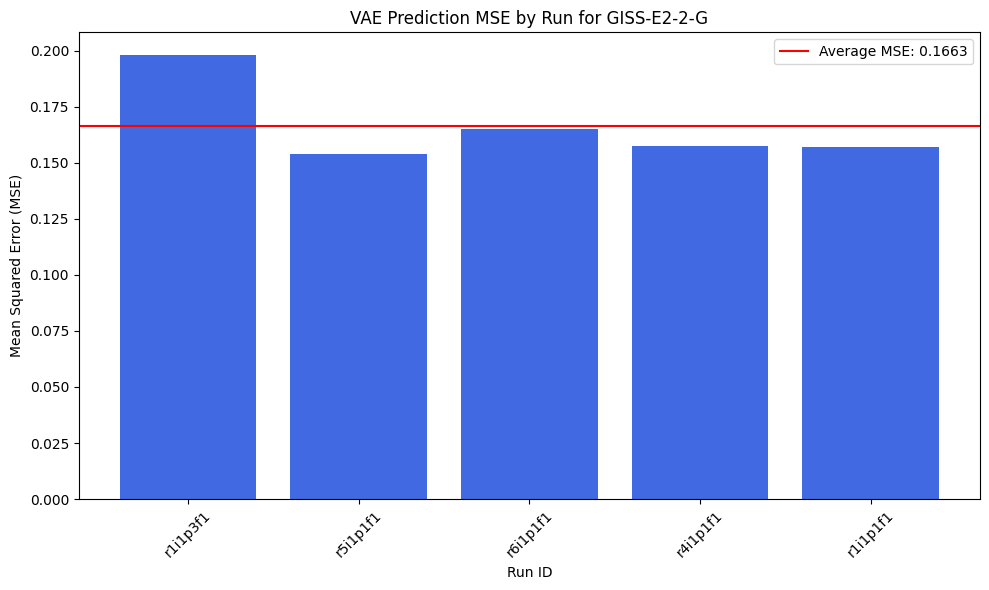

In [ ]:
# Plot MSE comparison
plt.figure(figsize=(10, 6))
runs = list(mse_values.keys())
mse_vals = list(mse_values.values())

plt.bar(runs, mse_vals, color='royalblue')
plt.axhline(y=np.mean(mse_vals), color='r', linestyle='-', label=f'Average MSE: {np.mean(mse_vals):.4f}')
plt.title(f'VAE Prediction MSE by Run for {test_model}')
plt.xlabel('Run ID')
plt.ylabel('Mean Squared Error (MSE)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(f"{animation_dir}/vae_mse_comparison_{test_model}.png", dpi=300, bbox_inches='tight')
plt.show()

# Generate New Data Using Latent Space
In this section, we will utilize the latent space and decoder of the trained VAE model to generate new synthetic data.

In [ ]:
# Set the VAE model to evaluation mode
vae_model.eval()

# Generate random latent vectors
num_samples = 5 # Batch size
latent_vectors = torch.randn((num_samples, z_dim)).to(device)

# Decode the latent vectors to generate new data
generated_data = vae_model.decode(latent_vectors).cpu().detach().numpy()

print(f"Generated data shape: {generated_data.shape}")

# Reshape the generated data to the original dimensions
generated_data_reshaped = [data.reshape(165, 6523) for data in generated_data]

# Create a directory for saving animations if it doesn't exist
animation_dir = os.path.join('outputs_vae_test', 'animations', 'vae_generated')
os.makedirs(animation_dir, exist_ok=True)
print(f"Generated animations will be saved to: {animation_dir}")

# Generate animations for the sampled latent space outputs
for i, data in enumerate(generated_data_reshaped):
    print(f"\nGenerating animation for Generated Sample {i + 1}...")
    
    # Readd nans to grid
    data_with_nans = readd_nans_to_grid(data, nan_mask, predictions=True)
    data_with_nans = data_with_nans.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    
    # Create animation
    generated_animation = animate_data(
        data_with_nans,
        title=f'Generated Sample {i + 1}',
        interval=200,
        cmap='viridis',
        color_limits=(vmin, vmax)
    )
    display(HTML(generated_animation.to_html5_video()))
    generated_animation.save(f"{animation_dir}/vae_generated_sample_{i + 1}.mp4", writer='ffmpeg', fps=15)

print(f"\nAll generated animations have been saved to {animation_dir}")

Generated data shape: (5, 1076295)
Generated animations will be saved to: outputs_vae_test/animations/vae_generated

Generating animation for Generated Sample 1...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 2...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 3...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 4...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 5...
Re-adding NaN values to the grid...



All generated animations have been saved to outputs_vae_test/animations/vae_generated
